<a href="https://colab.research.google.com/github/jorgementx/propuestas_trabajo_falsas_analisis_entrenamiento/blob/main/poster.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**PROYECTO POSTER - JORGE MENTXAKA**

# **Imports**


In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import re
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import io
import string

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering
from sklearn.utils import resample,shuffle
from sklearn.model_selection import train_test_split

from gensim.models import Word2Vec
from gensim.models.phrases import Phrases, Phraser
from collections import defaultdict
from wordcloud import WordCloud
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import seaborn as sns
from math import *
from decimal import Decimal

import pickle
import multiprocessing
import sys
import collections

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# **Cargando datos**

In [86]:
#train_set = "/content/drive/MyDrive/Mineria/fake_job_postings.csv"
train_set = "/content/drive/MyDrive/Mineria/prueba.csv" #igual al de arriba pero con coordenadas

In [106]:
X = pd.read_csv(train_set)

# **Analísis de datos**

In [5]:
len(X.index)

17880

In [8]:
X.head()

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent,lugar
0,1,Marketing Intern,"US, NY, New York",Marketing,NaN,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,NaN,0,1,0,Other,Internship,NaN,NaN,Marketing,0,"(40.7127281, -74.0060152)"
1,2,Customer Service - Cloud Video Production,"NZ, , Auckland",Success,NaN,"90 Seconds, the worlds Cloud Video Production ...",Organised - Focused - Vibrant - Awesome!Do you...,What we expect from you:Your key responsibilit...,What you will get from usThrough being part of...,0,1,0,Full-time,Not Applicable,NaN,Marketing and Advertising,Customer Service,0,"(-36.852095, 174.7631803)"
2,3,Commissioning Machinery Assistant (CMA),"US, IA, Wever",NaN,NaN,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,NaN,0,1,0,NaN,NaN,NaN,NaN,NaN,0,"(40.7116287, -91.2322109)"
3,4,Account Executive - Washington DC,"US, DC, Washington",Sales,NaN,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0,"(38.8950368, -77.0365427)"
4,5,Bill Review Manager,"US, FL, Fort Worth",NaN,NaN,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0,"(26.880495, -82.21849059909829)"


In [ ]:
X.loc[X['fraudulent'] == 1][:5] #analizando columna más representativa para usar en el entrenamiento

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent
98,99,IC&E Technician,"US, , Stocton, CA",Oil & Energy,95000-115000,...,"IC&amp;E Technician | Bakersfield, CA Mt. Poso...","QualificationsKnowledge, Skills &amp; Abilitie...",BENEFITSWhat is offered:Competitive compensati...,0,1,1,Full-time,Mid-Senior level,High School or equivalent,Oil & Energy,Other,1
144,145,Forward Cap.,NaN,NaN,NaN,NaN,The group has raised a fund for the purchase o...,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,1
173,174,Technician Instrument & Controls,US,Power Plant & Energy,NaN,Edison International and Refined Resources hav...,Technician Instrument &amp; ControlsLocation D...,JOB QUALIFICATIONS-Ability to understand proce...,"we are a team of almost 8,000 employees who he...",0,1,1,Full-time,Mid-Senior level,Certification,Electrical/Electronic Manufacturing,Other,1
180,181,Sales Executive,"PK, SD, Karachi",Sales,NaN,NaN,Sales Executive,Sales Executive,Sales Executive,0,0,0,NaN,NaN,NaN,NaN,Sales,1
215,216,IC&E Technician Mt Poso,"US, CA, Bakersfield, CA / Mt. Poso",Oil & Energy,95000-115000,...,"IC&amp;E Technician | Bakersfield, CA Mt. Poso...","QualificationsKnowledge, Skills &amp; Abiliti...",BENEFITSWhat is offered:Competitive compensati...,0,1,1,Full-time,Mid-Senior level,High School or equivalent,Oil & Energy,Other,1


En base a este pequeño analisis saco la condlusión de que el atributo que más información nos puede dar es la descripción. Aunque podría ser buena idea hacer uso de la ausencia o presencia de otros atributos para entrenar un modelo (por ejemplo los requeriemientos o si tiene logo de la compañia). A pesar de todo he decidido usar únicamente la descripción porque parece más interesante para la tarea de NLP.

In [ ]:
X['description'].isnull().values.sum() #numero de valores nulos; alternativamente user .any para devolver un booleano

1

In [9]:
X.loc[X['description'].isnull()] #fila con descripción nula

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent,lugar
17513,17514,Office Manager,"PL, MZ, Warsaw",NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,NaN,NaN,1,"(52.2319581, 21.0067249)"


## Visualizar en un mapa

In [ ]:
#ESTO LO HE EJECUTADO EN UN SERVIDOR EN PYTHON:
#nohup python3 main.py &
#disown
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent="job-postings")

# Get latitude and longitude by using city name
def get_location(adress):
    location = geolocator.geocode(adress)
    return location.latitude, location.longitude

# Get lat and lng
X['lugar'] = 1
for index, row in X.iterrows():
    count = 0
    while count < 5:
        try:
            latlong = str(get_location(row['location']))
            X.loc[index,'coordenadas'] = latlong
            #print(latlong)
            count = 6
        except:
            count += 1
    #time.sleep(5)

X.to_pickle("/content/drive/MyDrive/Mineria/fake_job_locations.pkl")
X.to_csv('/content/drive/MyDrive/Mineria/prueba.csv',index=False) #el csv que se carga al principio

In [81]:
print("Número de instancias con las coordenadas mal calculadas: ", X.loc[X['lugar'] == '1'].shape[0])

Número de instancias con las coordenadas mal calculadas:  997


In [107]:
#las coordenadas de "GB, LND, London" estan mal, devuelven 1 por eso como solución provisional las cambio a -> 51.5073219,-0.1276474
X.loc[X['location'] == 'GB, LND, London','lugar']='(51.5073219, -0.1276474)'
#lo mismo pero con US, , Stocton, CA (esto es un problema de formato sería US, CA, Stocton)-> 37.961632, -121.275604
X.loc[X['location'] == 'US, , Stocton, CA','lugar']='(37.961632, -121.275604)'
#GB, GBN, London
X.loc[X['location'] == 'GB, GBN, London','lugar']='(51.5073219, -0.1276474)'
#GB, LND, Shoreditch
X.loc[X['location'] == 'GB, LND, Shoreditch','lugar']='(51.5073219, -0.1276474)'
#GB, BIR, Birmingham
X.loc[X['location'] == 'GB, BIR, Birmingham','lugar']='(52.489471, -1.898575)'

In [ ]:
print("Número de instancias con las coordenadas mal calculadas: ", X.loc[X['lugar'] == '1'].shape[0])

In [108]:
# Split into lat and lng column
X_temp = pd.DataFrame(X['lugar'].str.split(' ',1).tolist(),columns = ['lat','lng'])
X = pd.concat([X['location'],X['fraudulent'], X_temp], axis=1)
# Remove unused characters
X['lat'] = X['lat'].str.replace('(','')
X['lat'] = X['lat'].str.replace(',','')
X['lng'] = X['lng'].str.replace(')','')
#convertir a float
X['lat'] = X['lat'].astype(float)
X['lng'] = X['lng'].astype(float)

In [110]:
X = X[X['lat'].notnull()] #filtrar los valores nulos
X = X[X['lng'].notnull()]

this_map = folium.Map(prefer_canvas=True)

def plotDot(lat,lng,col):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[lat, lng],
                        radius=1, color = col,
                        weight=5).add_to(this_map)

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
legit = X.loc[X['fraudulent'] == 0]
fake = X.loc[X['fraudulent'] == 1]
legit.apply(lambda x: plotDot(x['lat'],x['lng'],'blue'), axis = 1)
fake.apply(lambda x: plotDot(x['lat'],x['lng'],'red'), axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save('html_map_output/simple_dot_plot.html')

this_map

In [79]:
# Extract prefectures
prefecture_df = X['location'].value_counts().reset_index()
prefecture_df.columns = ['location','count']
prefecture_df['coordinates'] = prefecture_df['location'].apply(lambda x: X.loc[X['location'] == x, 'lugar'].iloc[0])

prefecture_df.head()

,location,count,coordinates
0,"GB, LND, London",718,"(51.5073219, -0.1276474)"
1,"US, NY, New York",658,"(40.7127281, -74.0060152)"
2,"US, CA, San Francisco",472,"(37.7790262, -122.419906)"
3,"GR, I, Athens",464,"(37.9733942, 23.733509042705766)"
4,"US, ,",339,"(36.81843005, -99.00906717303353)"


In [80]:
prefecture_df.loc[prefecture_df['coordinates'] == '1'].head(10)

,location,count,coordinates
26,"GR, ,",94,1
117,"GB, WKF, Wakefield",21,1
119,"GB, RIC, Twickenham",20,1
136,"GB, ISL, London",18,1
142,"GB, LND, London",18,1
160,"GB, NYK, Harrogate",16,1
197,"BE, VOV, Ghent",13,1
200,"GR, I, Neo Iraklio",13,1
225,"GB, SOM, Clevedon",11,1
228,"GB, GLG, Glasgow",11,1


In [36]:
# Split into lat and lng column
prefecture_temp = pd.DataFrame(prefecture_df['coordinates'].str.split(' ',1).tolist(),columns = ['lat','lng'])
prefecture_df = pd.concat([prefecture_df['location'], prefecture_df['count'], prefecture_temp], axis=1)

In [37]:
# Remove unused characters
prefecture_df['lat'] = prefecture_df['lat'].str.replace('(','')
prefecture_df['lat'] = prefecture_df['lat'].str.replace(',','')
prefecture_df['lng'] = prefecture_df['lng'].str.replace(')','')
#convertir a float
prefecture_df['lat'] = prefecture_df['lat'].astype(float)
prefecture_df['lng'] = prefecture_df['lng'].astype(float)
prefecture_df['count'] = prefecture_df['count'].astype(float)

In [38]:
prefecture_df.head()

,location,count,lat,lng
0,"GB, LND, London",718.0,51.507322,-0.127647
1,"US, NY, New York",658.0,40.712728,-74.006015
2,"US, CA, San Francisco",472.0,37.779026,-122.419906
3,"GR, I, Athens",464.0,37.973394,23.733509
4,"US, ,",339.0,36.818430,-99.009067


In [39]:
#prefecture_df = prefecture_df[prefecture_df['lat'].notnull()] #filtrar los valores nulos
#prefecture_df = prefecture_df[prefecture_df['lng'].notnull()] #filtrar los valores nulos
prefecture_df = prefecture_df.dropna()  #filtrar los valores nulos

In [47]:
import folium
from folium.plugins import HeatMap
hmap = folium.Map(location=[0, 0], control_scale = True, attr='USGS style',zoom_start=1.5)
tmp_data = prefecture_df[['lat', 'lng', 'count']]
data = tmp_data.values.tolist()
HeatMap(data, radius=9).add_to(hmap)
hmap

In [42]:
hmap.save("/content/drive/MyDrive/Mineria/heatmap.html")

# **Preprocesamiento**

In [ ]:
X = X[['description','fraudulent']]
#X = X.drop(X.columns[[0,1,2,3,4,5,7,8,9,10,11,12,13,14,15,16]], axis=1)
#se puede usar del X['column']

In [ ]:
X.head(10)

,description,fraudulent
0,"Food52, a fast-growing, James Beard Award-winn...",0
1,Organised - Focused - Vibrant - Awesome!Do you...,0
2,"Our client, located in Houston, is actively se...",0
3,THE COMPANY: ESRI – Environmental Systems Rese...,0
4,JOB TITLE: Itemization Review ManagerLOCATION:...,0
5,Job OverviewApex is an environmental consultin...,0
6,Your Responsibilities: Manage the English-spea...,0
7,Who is Airenvy?Hey there! We are seasoned entr...,0
8,Implementation/Configuration/Testing/Training ...,0
9,The Customer Service Associate will be based i...,0


## Limpieza

In [ ]:
X = X[X['description'].notnull()] #filtrar los valores nulos
#X.dropna(subset=[7])
len(X.index)

17879

In [ ]:
stop_words = set(stopwords.words('english')) #tokenizar, stopwords, signos de putuación y mayúsculas a minúsculas
tokenizer = RegexpTokenizer(r'\w+')
X['clean'] = X['description'].apply(lambda x: [w.lower() for w in tokenizer.tokenize(x) if w.lower() not in stop_words])

In [ ]:
X.head(10)

,description,fraudulent,clean
0,"Food52, a fast-growing, James Beard Award-winn...",0,"[food52, fast, growing, james, beard, award, w..."
1,Organised - Focused - Vibrant - Awesome!Do you...,0,"[organised, focused, vibrant, awesome, passion..."
2,"Our client, located in Houston, is actively se...",0,"[client, located, houston, actively, seeking, ..."
3,THE COMPANY: ESRI – Environmental Systems Rese...,0,"[company, esri, environmental, systems, resear..."
4,JOB TITLE: Itemization Review ManagerLOCATION:...,0,"[job, title, itemization, review, managerlocat..."
5,Job OverviewApex is an environmental consultin...,0,"[job, overviewapex, environmental, consulting,..."
6,Your Responsibilities: Manage the English-spea...,0,"[responsibilities, manage, english, speaking, ..."
7,Who is Airenvy?Hey there! We are seasoned entr...,0,"[airenvy, hey, seasoned, entrepreneurs, heart,..."
8,Implementation/Configuration/Testing/Training ...,0,"[implementation, configuration, testing, train..."
9,The Customer Service Associate will be based i...,0,"[customer, service, associate, based, phoenix,..."


Habría que considerar no quitar stopwords poruque pueden demostrar como suelen estar escritas las descripciones de los trabajos (el uso de we...).

### Word Embedding

In [ ]:
sent = X['clean']
phrases = Phrases(sent, min_count=30, progress_per=10000)
bigram = Phraser(phrases)
sentences = bigram[sent]

In [ ]:
word_freq = defaultdict(int)
for s in sentences:
    for i in s:
        word_freq[i] += 1
print(len(word_freq))

64395


In [ ]:
words=sorted(word_freq, key=word_freq.get, reverse=True)
print(words[0:100])

['team', 'work', 'company', 'business', 'experience', 'sales', 'new', 'development', 'product', 'management', 'looking', 'support', 'marketing', 'amp', 'design', 'clients', 'customers', 'client', 'position', 'customer', 'working', 'services', 'role', 'data', 'including', 'project', 'responsible', 'provide', 'skills', 'service', 'based', 'ensure', 'job', 'people', 'software', 'solutions', 'technical', 'products', 'well', 'develop', 'required', 'help', 'technology', 'process', 'projects', 'environment', 'also', 'manager', 'within', 'build', 'manage', 'knowledge', 'requirements', 'systems', 'one', 'opportunity', 'time', 'maintain', 'quality', 'growth', 'us', 'information', 'customer_service', 'performance', 'web', 'training', 'industry', 'teams', 'make', 'create', 'responsibilities', 'office', 'strong', 'ability', 'operations', 'lead', 'great', 'building', 'must', 'needs', 'engineering', 'using', 'key', 'content', 'best', 'opportunities', 'part', 'system', 'need', 'professional', 'growing

Text(0.5, 1.0, '')

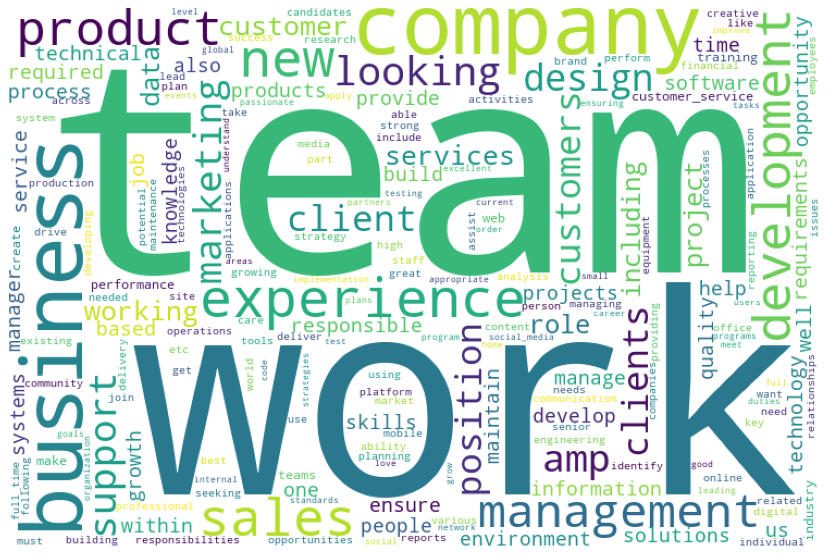

In [ ]:
plt.figure(figsize=(15,10))
wordcloud = WordCloud(background_color='white',width=750,height=500).fit_words(word_freq) # fixed
plt.imshow(wordcloud)
plt.axis('off')
plt.title('',fontsize=20)

Los resultados son lo que nos podemos esperar del texto de una entrevista de trabajo, donde palabras como trabajo, negocio, equipo, empresa, producto, etc., predominan.

## Cargar modelo W2V 

In [ ]:
filename = "/content/drive/MyDrive/Mineria/w2v.sav"
w2v_model = pickle.load(open(filename, 'rb'))

FileNotFoundError: ignored

## Crear modelo *W2V*

In [ ]:
cores = multiprocessing.cpu_count()
print(cores)

2


In [ ]:
w2v_model = Word2Vec(sentences, min_count=20,size=100, window=5, workers=cores) #window size default=5 (hacer optimización de parametros con window)

**Explicacion de window:**

Larger windows tend to capture more topic/domain information: what other words (of any type) are used in related discussions? Smaller windows tend to capture more about word itself: what other words are functionally similar? (Their own extension, the dependency-based embeddings, seems best at finding most-similar words, synonyms or obvious-alternatives that could drop-in as replacements of the origin word.

For example "stackoverflow great website for programmers" with 5 words (suppose we save the stop words great and for here) if the window size is 2 then the vector of word "stackoverflow" is directly affected by the word "great" and "website", if the window size is 5 "stackoverflow" can be directly affected by two more words "for" and "programmers". The 'affected' here means it will pull the vector of two words closer.

In [ ]:
# save the model w2v to disk
filename = "/content/drive/MyDrive/Mineria/w2v_2.sav"
pickle.dump(w2v_model, open(filename, 'wb'))

### Vectorización de instancias

In [ ]:
w2v_model.wv.most_similar(positive=["linux"], topn=20)

[('unix', 0.9268627762794495),
 ('windows', 0.8958299160003662),
 ('aws', 0.885692834854126),
 ('vmware', 0.884831428527832),
 ('server', 0.8819866180419922),
 ('os', 0.8768795728683472),
 ('sql_server', 0.8757951259613037),
 ('oracle', 0.8614799976348877),
 ('ms_sql', 0.8598076105117798),
 ('mvc', 0.8591993451118469),
 ('operating_systems', 0.8494502305984497),
 ('python', 0.8472506999969482),
 ('hadoop', 0.8406528830528259),
 ('url_01a736d89d2f0b19de700923d2c312837e180465650804d0f84105352812bf9a',
  0.8387666940689087),
 ('mysql', 0.8379133939743042),
 ('git', 0.8373637199401855),
 ('shell', 0.8363771438598633),
 ('soap', 0.8363132476806641),
 ('2008', 0.8361687660217285),
 ('azure', 0.8361034989356995)]

In [ ]:
def vectorize(list_of_sentences, model):
    """Generate vectors for list of sentences using a Word Embedding

    Args:
        list_of_sentences: List of sentences
        model: Gensim's Word Embedding

    Returns:
        List of sentencences vectors
    """
    features = []
    zero_vector = np.zeros(model.vector_size)

    for tokens in list_of_sentences:
        #zero_vector = np.zeros(model.vector_size)
        vectors = []
        for token in tokens:
            if token in model.wv:
                try:
                    vectors.append(model.wv[token])
                except KeyError:
                    continue
        #print(vectors)
        if vectors:
            vectors = np.asarray(vectors)
            avg_vec = vectors.mean(axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features

In [ ]:
vectorized_sent = vectorize(sent, model=w2v_model)
len(vectorized_sent), len(vectorized_sent[0])

(17879, 100)

# **Hold-out**

## train test split

In [ ]:
X['vectors'] = vectorized_sent

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X, X.fraudulent, test_size=0.25, random_state=42, stratify=X.fraudulent, shuffle=True)

In [ ]:
X_train.shape[0],X_test.shape[0]

(13409, 4470)

## Resampling

In [ ]:
X_train_fake = X_train[X_train['fraudulent'] == 1]
X_train_true = X_train[X_train['fraudulent'] == 0]

In [ ]:
X_train_fake.shape[0], X_train_true.shape[0]

(649, 12760)

In [ ]:
X_train_fake_upsampled = resample(X_fake,random_state=1,n_samples=len(X_fake)*8,replace=True)
X_train_fake_upsampled.shape[0],X_train_true.shape[0]

(5192, 12760)

In [ ]:
X_train = pd.concat([X_train_fake_upsampled, X_train_true])

In [ ]:
x_train = X_train.drop(['clean','fraudulent','description'],axis=1)
x_test = X_test.drop(['clean','fraudulent','description'],axis=1)
y_train = X_train.fraudulent
y_test = X_test.fraudulent #esto no es necesario

In [ ]:
x_train.shape[0], x_test.shape[0]

(17952, 4470)

## Entrenando modelo

svm, kmeans, naive bayes, neural network...

## Evaluación (fscore de la clase minoritaria)

The F1-score is useful:

• where there are either differing costs of false positives or false negatives, such as in the mammogram example

• **or where there is a large class imbalance, such as if 10% of apples on trees tend to be unripe. In this case the accuracy would be misleading, since a classifier that classifies all apples as ripe would automatically get 90% accuracy but would be useless for real-life applications**.